In [1]:
# Importing modules used in the lecture
import numpy as np
from numpy import cos, sin, tan, pi, exp
import matplotlib.pyplot as plt
import scipy.signal as sig
from scipy.io import wavfile
from IPython.display import Audio

plt.rcParams["figure.figsize"] = [8.00, 4.5]
plt.rcParams["figure.autolayout"] = True
plt.rcParams["axes.grid"] = True
plt.rcParams["axes.xmargin"] = 0.0

%matplotlib inline

<img src="figures/NTNU_logo_vertical.svg" align="left" style="width: 30%">
<br clear="all" />
<br></br>

# Noise cancelling headphones, and a short intro to Adaptive FIR Filters

* **Course AIS2201 - Signal Processing**
* **Week 46, 2024**
* **Lecturer: Kai Erik Hoff**

# Topics:




* Modeling noise cancelling as a system identification problem

* System identification using Adaptive FIR Filtering

* Other uses of adaptive filters

# Noise cancelling headphones general overview

<img src="figures/nc_headphones.gif" align="center" style="width: 60%; margin-left:100px">

Derived in OneNote

# Simplified model for system identification


<img src="figures/adaptive_nc.svg" align="center" style="width: 60%; margin-left:100px">

* **Explanation of notation for noise-cancelling headphones model:**
    * $s[n]$ is source audio stream
    * $x[n]$ is external noise as observed by exterior reference microphone
    * $e[n]$ is the internal microphone signal, equal to noise-cancelled audio
    * $d[n]$ is noisy audio without noise-cancelling (not observable)

* **Principle:**
    * If $\hat{H}(\hat{\omega}) = H(\hat{\omega})$, then $\hat{s}[n] = s[n] + v[n]*h[n] - v[n]*\hat{h}[n] = s[n]$

* **Assumptions:**
    * $s[n]$ and $x[n]$ are assumed to be *uncorrelated*
        * *Implication:* The desired filter $\hat{H}(\hat{\omega})$ will be one that *minimizes the power/variance* $P_{e}=E\left(e^2[n]\right)$ 

# Mean squared error

<img src="figures/MMSE.png" align="right" style="width: 600px">

* $e[n]=0$ not practically possible unless noise power also equals zero
* Mean Square Error (MSE)
$$E\left(|e[n]|^2\right) = E\left(|d[n] - \hat{h}[n]*x[n]|^2\right)$$
    * Will be a quadratic funciton of filter impulse response vector $\vec{h} = [h[0], h[1], \ldots, h[M-1]]^T$
 
* Optimal filter $\vec{h}_{opt}$ identified by solving:
$$ \frac{\delta E\left(|e[n]|^2\right)}{\delta \vec{h}}=0 \tag{1}$$



# Gradient descent

* Iterative optimization algorithm, can find the local minimum of a function (e.g. $f(x) = (x-3)^2 + 2$)
    * Also works when $x$ is a vector of $N$ independent values
* Algorithm:
$$ \vec{x}_{n+1} = \vec{x}_n - \mu \nabla f(\vec{x}_n) $$
    * $\mu$ is the step size

#### Example:

In [40]:
# Run cell once to initialize
f = lambda x: (x-3)**2+2  # f(x)
df = lambda x: 2*(x-3)*1  # Derivative of f(x)

mu = 0.8  # step size

x_n = [0]   # Initial value

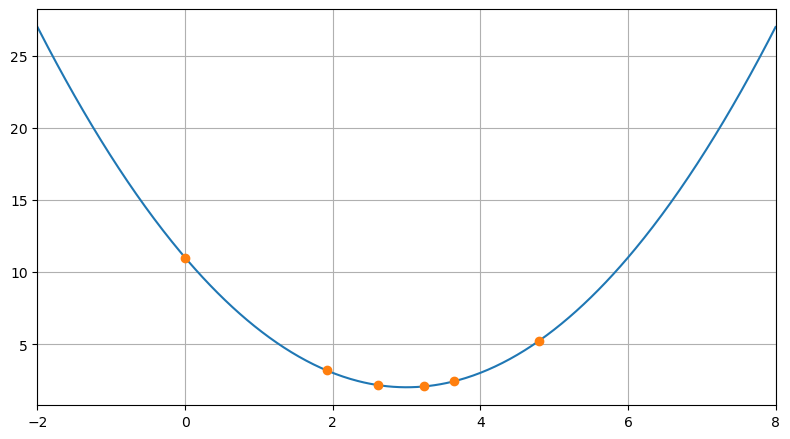

In [46]:
# Run repeatedly to observe gradient descent in 1D
x_next = x_n[-1] - mu*df(x_n[-1])
x_n.append(x_next)

x = np.linspace(-2, 8, 501)
plt.plot(x, f(x))
plt.plot(x_n, f(np.array(x_n)), 'o')
plt.show()

## Gradient descent visualization for function of 2 variables

In [42]:
%%html
<iframe width="700" height="700" src="https://upload.wikimedia.org/wikipedia/commons/4/4c/Gradient_Descent_in_2D.webm"></iframe> 

# The Least Mean Squares (LMS) algorithm
* Gradient descent algorithm to find optimal filter coefficients $\vec{h}_{opt}$
    * Function to minimize: $E\left(|e[n]|^2 \right)\ \big| \ \vec{h} = F(\vec{h})$
    * Derivative of MSE: $\nabla F(\vec{h}) = -2\cdot e[n]\cdot \vec{h}_n$
 
* LMS Algorithm:
$$\vec{h}_{n+1} = \vec{h}_n + \mu \cdot e[n] \cdot \vec{x}_n$$
where $\vec{x}_m$ is a vector of the $M$ most recent samples in reverse order: $\vec{x}_n = \left[x[n-1], x[n-2], \ldots , x[n-M]\right]^T$

* Each filter coefficient $h[k]$ in the vector $\vec{h}$ is a *linearly independent variable* in the squared error function
$$E\left(|e[n]|^2 \right) = E\left(|x[n]*h[n] - d[n]|^2 \right)$$

# LMS Noise-cancelling algorithm flowchart

<img src="figures/nc_flowchart.svg" align="center" style="width: 50%; margin-left:200px">

## LMS noise cancelling example:


In [24]:
# Sample interference:
fs, xn = wavfile.read("../data/Engine-16-44p1-stereo-20sec.wav")
xn = xn/np.max(np.abs(xn)) # Normalize input and convert to float
xn = np.sum(xn, axis=1) # Combine to mono
Audio(xn, rate=fs)

In [27]:
# Sample music:
fs, sn = wavfile.read("../data/Ecstacy_of_gold_intro.wav")
sn = sn/np.max(np.abs(sn)) # Normalize input and convert to float
sn = np.sum(sn, axis=1) # Combine to mono
Audio(sn, rate=fs)

Example filter impulse response for headphone used in simulation: $h[n] = \frac{n}{4}e^{-\frac{n}{2}}$

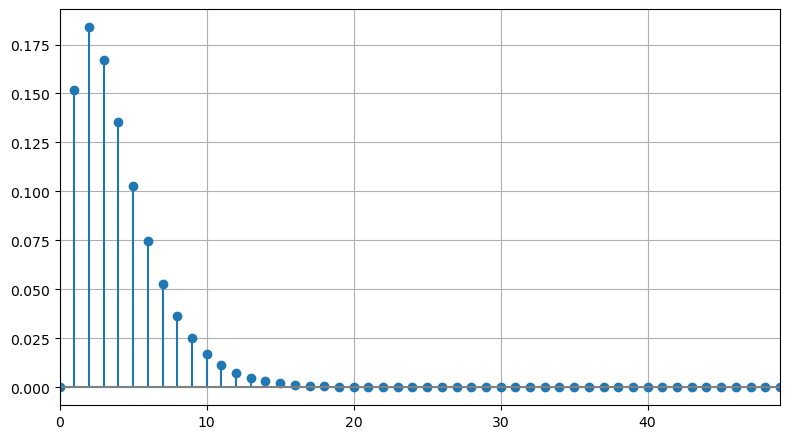

In [25]:
# example headphone filter model:
n = np.arange(50)
hn = n/4*np.exp(-n/2)
plt.stem(n, hn, basefmt="grey")
plt.show()

**Simulating noisy audio:**

In [28]:
xn_filt = np.convolve(xn, hn)
Lx = np.min((len(xn_filt), len(sn)))
dn = xn_filt[:Lx] + sn[:Lx]
Audio(dn, rate=fs)

**Simulating adaptive noise cancelling:**

In [31]:
def NC_lms(x, x_filt, s, mu, numtaps):
    h = np.zeros(numtaps)
    error = np.zeros(len(x))
    for n in range(len(x)):
        # Filter with adaptive coefficients
        n1, n2 = max(n-numtaps, 0), n 
        x_indices = np.flip(np.arange(n1, n2))
        x_est = np.sum(h[0:n2-n1]*x[x_indices])

        # Subtract estimated noise from audio (and send to speaker)
        yn = s[n] - x_est 
        
        # Simulate interior of headset
        error[n] = yn + x_filt[n] # Add noise that has passed through headphone cup

        # Update filter coefficients
        h[0:n2-n1] += mu*error[n]*x[x_indices]

    return error, h
error, h = NC_lms(xn[:Lx], xn_filt[:Lx], sn[:Lx], mu=1e-4, numtaps=65)

In [32]:
Audio(error, rate=fs)

#### Disclaimer

* This was a simplified example. In practice, the signal path though $\text{ADC} \rightarrow \text{speaker} \rightarrow \text{interior microphone} \rightarrow \text{DAC}$ also needs to be accounted for.
* The complete algorithm used in adaptive noise cancelling is known as the [Filtered-x LMS Algorithm](https://ieeexplore.ieee.org/document/763310).

# LMS Filter step size considerations


* Large step size:
    1. Faster convergence with "optimal" filter coefficients
    2. Larger error values once filter has converged
    3. Potentially unstable!

* Small step size:
    1. Slower to converge with "optimal" filter coefficients
    2. May not be able to "keep up" with changes in a time-varying signal

* Overall:
    * Convergence speed / stability dependent by signal power!
$$P_x = E(x^2[n])$$

# The Normalized LMS filter

* Normalizes the input according to estimated signal power based on $M$ samples in filter state buffer:
$$\hat{P}_x[n] = \sum_{k=0}^{M-1}x^2[n-k]$$

* The normalized LMS algorithm:
$$\vec{h}_{n+1} = \vec{h}_n + \frac{\mu \cdot e[n] \cdot \vec{x}_n}{\alpha + \hat{P}_x[n]}$$
where $\mu$ is a static step size and $\alpha$ safeguards against dividing by zero.

* Stability criterion:
$$0 <\mu < 2$$

# Adaptive filters: generalized principle


<img src="figures/adaptive_filter.svg" align="center" style="width: 60%; margin-left:100px">

1. Filter a sampled signal $x[n]$ using a *instantaneous* filter impulse response $\vec{h}_n=\left[h[0], h[1], \ldots , h[M-1]\right]^T$ to produce an estimate $\hat{s}[n]$ of a desired output.
2. Calculate the error $e[n] = s[n] - \hat{s}[n]$
3. Use the error to update the next filter vector $\vec{h}_{n+1}$ by using e.g. the LMS algorithm

# Aternative application: predictor / whitening filter

<img src="figures/prediction.svg" align="center" style="width: 60%; margin-left:100px">

* With optimal prediction, $e[n]$ becomes white uncorrelated noise.
    * White noise is by nature not predictable.
* The output of the predictor $\hat{x}[n]$ will approach the remainder of the signal once white noise is removed.

# LMS algorithm flowchart

<img src="figures/prediction_flowchart.svg" align="center" style="width: 50%; margin-left:200px">

## LMS example

* Use a normalized LMS filter to filter the signal $x[n] = s[n] + v[n]$ where $s[n] = \sin\left(2\pi \cdot 440 \cdot \frac{n}{f_s}\right)$ and $v[n]$ is White Gaussian Nise (WGN) with variance $\sigma_v^2 = 1$.
    * $f_s$ is 8000 samples/second.
    * $\mu = 0.01$


In [47]:
# Signal generation
fs = 8000
T = 3
t_n = np.linspace(0, T, T*fs, endpoint=False)
s_n = np.sin(2*np.pi*440*t_n)
noise_var = 1
x_n = (s_n + np.random.normal(loc=0, scale=np.sqrt(noise_var), size=len(t_n)))*5

Audio(x_n, rate=fs)

In [48]:

def FIR_lms_norm(x, M, mu, alpha=1):
    h = np.zeros(M)  # Initial filter values
    y = np.zeros(len(x))
    err_log = np.zeros(len(x))
    for n in range(0, len(x)):
        n1 = max(n-M, 0)
        n2 = n
        x_indices = np.flip(np.arange(n1, n2))
        x_pred = np.sum(h[0:n2-n1]*x[x_indices])
        x_pow = sum(x[x_indices]**2)
    
        err = x[n]-x_pred
        h[0:n2-n1] += mu*err*x[x_indices]/(alpha + x_pow)
    
        y[n] = x_pred
        err_log[n] = err
    return y, err_log

y_n, e_n = FIR_lms_norm(x_n, M = 256, mu=0.01) 
Audio(y_n, rate=fs)

# LMS Filter summary

* Self-tuning
    * Can adapt to signals whose frequency content changes with time

* Computationally simple
    * No matrix inversions or other problems which must be solved iteratively involved.
    * Kalman filters can be used to achieve faster convergence with optimal filter.

* Normalized LMS generally desirable
    * Automatically adjusts step size to signal power

## LMS on STM32
* Built-in functions included in the CMSIS-DSP library
    * [LMS Filtering functions](https://arm-software.github.io/CMSIS_5/DSP/html/group__LMS.html)
    * [Normalized LMS Filtering functions](https://arm-software.github.io/CMSIS_5/DSP/html/group__LMS__NORM.html)

# Questions?